In [1]:
from numpy import stack, uint8
from tifffile import imwrite as tifffileimwrite
from json import loads as jsonloads
from pymysql import connect as pymysqlconnect


def LoginWSIViewer():
    """Return pymysql cursor which connected to showinfos database.

    Parameters
    ----------
    None

    Returns
    -------
    cur : pymysql connect cursor
    """
    conn = pymysqlconnect(host="localhost", user="wsiviewer", password="1q2w3e4r", db="showinfos")
    cur = conn.cursor()

    return cur

def GetWSIInfos(cur, nameSchemaEx):
    """Organize mysql databases WSI informations to dictionary.

    Parameters
    ----------
    cur : pymysql connect cursor
        Mysql cursor pointed in mysql database.

    nameSchemaEx : string
        Viewer table name.

    Returns
    -------
    wsiinfo : Dictionary
        Organized WSI information from database table.

    Example
    -------
    >>> cur = LoginWSIViewer()
    >>> wsiluadinfo = GetWSIInfos(cur, "wsiluadinfo")
    """
    #mysql SELECT
    cur.execute("SELECT * FROM %s;"%nameSchemaEx)
    results = cur.fetchall()

    #Organized in dictionary
    wsiinfo = {}
    for data in results:
        corrdihuman = data[2]
        corrdilearn = data[3]
        #If not have data, It remain just None
        if bool(data[2]):
            corrdihuman = jsonloads(corrdihuman)
        if bool(data[3]):
            corrdilearn = jsonloads(corrdilearn)
        tmpDic = {"filepath" : data[1], "corrdihuman" : corrdihuman, "corrdilearn" : corrdilearn}
        wsiinfo[data[0]] = tmpDic

    return wsiinfo

def SaveMaskBigtiff(pathMask, mask):
    """Save array as BigTiff file format.

    Parameters
    ----------
    pathMask : string
        Save file path

    mask : 2-D Array
        Boolean type mask array

    Returns
    -------
    None

    Example
    -------
    >>> import numpy as np

    >>> mask = np.zeros((10000, 10000), dtype=bool)
    >>> SaveMaskBigtiff("test.tif", mask)
    """
    mask = (mask*255).astype(uint8)
    tifffileimwrite(pathMask, stack([mask, mask, mask], 2), compression="lzw", bigtiff=True, tile=(256, 256))

    return None

In [2]:
from cv2 import cvtColor, fillPoly, inRange, split, GaussianBlur, Laplacian, COLOR_BGR2RGB, COLOR_RGB2HSV_FULL, CV_8U
from cv2 import imwrite as cv2imwrite
from cv2 import resize as cv2resize
from matplotlib.pyplot import axis, axvspan, figure, imshow, plot, show, subplot, title, yscale
from numpy import array, histogram, hstack, ones, uint8, zeros
from numpy.linalg import norm as npnorm
from numpy import round as npround


def CvtHSVLDic(img):
    """Split and convert RGB chennel uint8 array to Hue, Saturation, Value, Laplacian.

    Parameters
    ----------
    img : 3-D Array
        Original RGB chennel array will convert and split

    Returns
    -------
    hsvlDic : Dictionary
        Contained Hue, Saturation, Value, Laplacian array
        {'h' : Hue 2-D Array,
        's' : Saturation 2-D Array,
        'v' : Value 2-D Array,
        'l' : Laplacian 2-D Array}

    Example
    -------
    >>>import matplotlib.pyplot as plt
    >>>import numpy as np
    >>> import cv2

    >>> img = np.ones((4, 4, 3))
    >>> img = np.random.normal(img, 1)*255
    >>> img = cv2.resize(img, dsize=(64, 64))
    >>> img = img.astype(np.uint8)
    >>> hsvlDic = CvtHSVLDic(img)

    >>> plt.imshow(hsvlDic['h'], "hsv")
    >>> plt.show()
    >>> plt.imshow(hsvlDic['s'], "gray")
    >>> plt.show()
    >>> plt.imshow(hsvlDic['v'], "binary")
    >>> plt.show()
    >>> plt.imshow(hsvlDic['l'], "gray")
    >>> plt.show()
    """
    imgH, imgS, imgV = split(cvtColor(img, COLOR_RGB2HSV_FULL))
    imgL = Laplacian(imgV, CV_8U, ksize=3)

    return {'h' : imgH, 's' : imgS, 'v' : imgV, 'l' : imgL}

def RangeSelecter(hsvlDic, rangeSelectDic):
    """Get color range and divid color in or out range.
    
    And calculate intersection region each case.
    
    Parameters
    ----------
    hsvlDic : Dictionary
        Contained Hue, Saturation, Value, Laplacian array
        {'h' : Hue 2-D Array,
        's' : Saturation 2-D Array,
        'v' : Value 2-D Array,
        'l' : Laplacian 2-D Array}

    rangeSelectDic : Dictionary
        Contained Hue, Saturation, Value, Laplacian selection range
        {'h' : (start, end),
        's' : (start, end),
        'v' : (start, end),
        'l' : (start, end)}
    
    Returns
    -------
    imgT : 2-D Array
        Intersection array with each 'h', 's', 'v', 'l' color range selected region

    See Also
    --------
    CvtHSVLDic : Split and convert RGB chennel uint8 array to Hue, Saturation, Value, Laplacian.

    Examples
    --------
    >>> import matplotlib.pyplot as plt
    >>> import numpy as np
    >>> import cv2

    >>> img = np.ones((4, 4, 3))
    >>> img = np.random.normal(img, 1)*255
    >>> img = cv2.resize(img, dsize=(64, 64))
    >>> img = img.astype(np.uint8)
    >>> hsvlDic = CvtHSVLDic(img)

    >>> rangeSelectDic = {'h' : (64, 255), 's' : (64, 255), 'v' : (64, 255), 'l' : (0, 64)}
    >>> mask = RangeSelecter(hsvlDic, rangeSelectDic)

    >>> plt.imshow(mask)
    >>> plt.show()
    """
    imgT = ones((hsvlDic['h'].shape[0], hsvlDic['h'].shape[1]), dtype=uint8)
    # Calculate intersection as boolean multuple
    for _type in ('h', 's', 'v', 'l'):
        imgT *= inRange(hsvlDic[_type], rangeSelectDic[_type][0], rangeSelectDic[_type][1])

    return imgT.astype(float)

def RegionMasking(img, rangeSelectList, gauthSelect):
    """Make color range selected specific region as Mask.

    Process
    1. Make empty mask array as same as input image size.
    2. Calculate specific region by using RangeSelecter function.
    3. Add region to mask like union until all use rangeSelectList.
    4. Use Gaussian blurring and Thresholding in mask.

    Parameters
    ----------
    img : 3-D Array
        Original RGB chennel array will convert and split

    rangeSelectList : List
        List of color range dictionary.
        Each dictionary contained Hue, Saturation, Value, Laplacian selection range
        {'h' : (start, end),
        's' : (start, end),
        'v' : (start, end),
        'l' : (start, end)}

    gauthSelect : Dictionary
        Gaussian blurring x, sigma value and thresholding value.
        {"gX" : x value, "gS" : sigma value, "th" : threshold value}

    Returns
    -------
    mask : 2-D Array
        Color selected region mask array.

    See Also
    --------
    CvtHSVLDic : Split and convert RGB chennel uint8 array to Hue, Saturation, Value, Laplacian.
    RangeSelecter : Get color range and divid color in or out range.

    Examples
    --------
    >>> import numpy as np
    >>> import openslide

    >>> rangeSelectList = [{'h' : (128, 250), 's' : (20, 250), 'v' : (60, 240), 'l' : (20, 255)}]
    >>> gauthSelect = {"gX" : 31,"gS" : 21, "th" : 0.2}

    >>> handleWSI = openslide.OpenSlide(WSI file path)
    >>> img = np.array(handleWSI.read_region((0, 0), 2, handleWSI.level_dimensions[2]).convert("RGB"))

    >>> hsvlDic = CvtHSVLDic(img)
    >>> ShowSelectHistogram(hsvlDic, rangeSelectList[0])
    >>> maskSpec = RegionMasking(img, rangeSelectList, gauthSelect)
    """
    hsvlDic = CvtHSVLDic(img)
    # Process 1
    mask = zeros((img.shape[0], img.shape[1]))
    # Process 2 (for), 3 (+=)
    for rangeSelectDic in rangeSelectList:
        mask += RangeSelecter(hsvlDic, rangeSelectDic)
    # Process 4
    mask = inRange(GaussianBlur(mask, (gauthSelect["gX"], gauthSelect["gX"]), gauthSelect["gS"]), gauthSelect["th"], 1).astype(bool)

    return mask

def CorrdinateMasking(sizes, downsample, coordinates):
    """Make annotation region as Mask.

    Draw each polygon from coordinates data into mask array.
    Coordinates have downsampling referred on downsample parameter.

    Parameters
    ----------
    sizes : Tuple
        Mask size. (y, x)

    downsample : Float
        Coordinates downsample value.
        Each corrdinate will be divided this parameter.

    coordinates : List
        List of multi ploygon.
        First list has polygon list.
        Second list is just outer list to easily use cv2.fill polygon function.

    Returns
    -------
    mask : 2-D Array
        Annotation region mask array.

    Examples
    --------
    >>> import matplotlib.pyplot as plt

    >>> coor1 = [[10,10], [10,20], [20,10]]
    >>> coor2 = [[30,30], [30,40], [40,40], [40,30]]
    >>> coorTot = [[coor1], [coor2]]
    >>> size = (6, 6)

    >>> mask = CorrdinateMasking(size, 10, coorTot)
    >>> plt.imshow(mask)
    >>> plt.show()
    """
    mask = zeros((sizes[0], sizes[1]), dtype=uint8)
    for coordinatesParts in coordinates:
        coordinatesMini = (array(coordinatesParts[0]) / downsample).astype(int)
        mask = fillPoly(mask, pts=[coordinatesMini], color=1)
    mask = mask.astype(bool)

    return mask

def DiagnoalNormalize(lengthX, lengthY):
    """Calculate normalized diagnoal length.

    Parameters
    ----------
    lengthX : Float

    lengthY : Float

    Returns
    -------
    normalizeX, normalizeY : Tuple
        Normalized X, Y value. (normalizeX**2 + normalizeY**2 = 1)

    Examples
    --------
    >>> norX, norY = DiagnoalNormalize(4, 3)
    >>> print(norX, norY)
    0.8 0.6
    >>> print(norX**2 + norY**2)
    1
    """
    lengthDiagonal = npnorm([lengthX, lengthY])
    normalizeX = lengthX/lengthDiagonal
    normalizeY = lengthY/lengthDiagonal

    return normalizeX, normalizeY

def ShowSelectHistogram(hsvlDic, rangeSelect):
    """Show process step of RangeSelecter function.

    This function just show process of color range selection in using RangeSelecter process.
    First figures are splited and converted chennel mask about "Hue", "Saturation", "Value", "Laplacian".
    Second figures show histogram of color value and selected color range.
    Final figures selected region at each chennel.
    
    Parameters
    ----------
    hsvlDic : Dictionary
        Contained Hue, Saturation, Value, Laplacian array
        {'h' : Hue 2-D Array,
        's' : Saturation 2-D Array,
        'v' : Value 2-D Array,
        'l' : Laplacian 2-D Array}

    rangeSelectDic : Dictionary
        Contained Hue, Saturation, Value, Laplacian selection range
        {'h' : (start, end),
        's' : (start, end),
        'v' : (start, end),
        'l' : (start, end)}

    Returns
    -------
    None

    See Also
    --------
    RangeSelecter : Get color range and divid color in or out range.
    """
    yImg, xImg = hsvlDic['h'].shape

    xHisto = 10
    yHisto = 6
    
    typeDic = {'h':"Hue",'s':"Saturation",'v':"Value",'l':"Laplacian"}
    cmapDic = {'h':"hsv",'s':"gray",'v':"binary",'l':"gray"}

    imgXNor, imgYNor = DiagnoalNormalize(xImg, yImg)
    histoXNor, histoYNor = DiagnoalNormalize(xHisto, yHisto)

    figsizeX, figsizeY = DiagnoalNormalize(4*imgXNor, imgYNor)
    figure(figsize=(20*figsizeX, 20*figsizeY))
    for _num, _type in enumerate(('h', 's', 'v', 'l')):
        subplot(1,4,_num+1)
        title("%s Image"%typeDic[_type])
        imshow(hsvlDic[_type],cmapDic[_type])
        axis("off")
    show()
    
    figsizeX, figsizeY = DiagnoalNormalize(4*histoXNor, histoYNor)
    figure(figsize=(20*figsizeX, 20*figsizeY))
    for _num, _type in enumerate(('h', 's', 'v', 'l')):
        histo, x = histogram(hstack(hsvlDic[_type]), bins=64, range=(0, 255))
        subplot(1,4,_num+1)
        title("Histogram")
        plot(x[:-1], histo, "blue")
        yscale("log")
        axvspan(rangeSelect[_type][0], rangeSelect[_type][1], alpha=0.5, color='red')
    show()

    figsizeX, figsizeY = DiagnoalNormalize(4*imgXNor, imgYNor)
    figure(figsize=(20*figsizeX, 20*figsizeY))
    for _num, _type in enumerate(('h', 's', 'v', 'l')):
        subplot(1,4,_num+1)
        title("Selected Mask")
        imshow(inRange(hsvlDic[_type], rangeSelect[_type][0], rangeSelect[_type][1]))
        axis("off")
    show()

    return None

def ShowOverlapMask(img, mask, ratio, pathSave=None):
    """Show masked region on original image.

    Parameters
    ----------
    img : 3-D Array
        Original RGB chennel array.

    mask : 2-D Array
        Boolean type mask array will overlapping.

    ratio : Float
        Draw overlapped image's downsample ratio.

    pathSave : String, default: None
        Save overlapped image's path. if None, it will be not saved.
    """
    ratio = 1/4
    y, x, _ = img.shape
    preVimg = cv2resize(img.astype(float), dsize=(int(x*ratio), int(y*ratio)))
    preVmask = cv2resize(mask.astype(float), dsize=(int(x*ratio), int(y*ratio)))
    preVmask = npround(preVmask).astype(bool)
    preVimg[preVmask == False] /= 2
    preVimg = preVimg.astype(np.uint8)

    imshow(preVimg)
    show()

    if pathSave:
        cv2imwrite(pathSave, cvtColor(preVimg, COLOR_BGR2RGB))

    return None

In [3]:
cur = LoginWSIViewer()
wsiluadinfo = GetWSIInfos(cur, "wsiluadinfo")

In [4]:
import openslide

pathWSI = wsiluadinfo["TCGA-38-A44F-01Z-00-DX1"]["filepath"]
handleWSI = openslide.OpenSlide(pathWSI)

In [5]:
rangeSelectList = [{'h' : (128, 250), 's' : (20, 250), 'v' : (60, 240), 'l' : (20, 255)}]
gauthSelect = {"gX" : 31,"gS" : 21, "th" : 0.2}

In [6]:
import numpy as np

img = np.array(handleWSI.read_region((0, 0), 2, handleWSI.level_dimensions[2]).convert("RGB"))

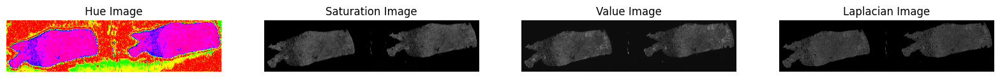

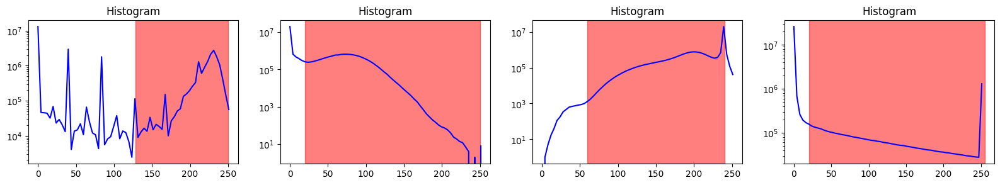

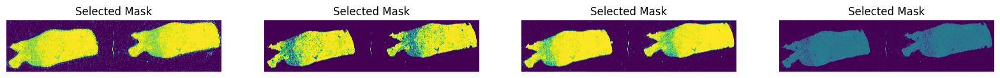

In [7]:
hsvlDic = CvtHSVLDic(img)
ShowSelectHistogram(hsvlDic, rangeSelectList[0])

In [8]:
maskSpec = RegionMasking(img, rangeSelectList, gauthSelect)

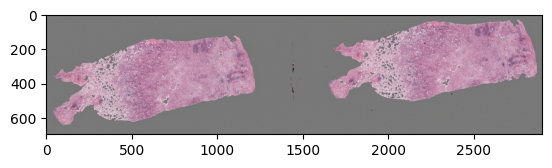

In [9]:
ShowOverlapMask(img, maskSpec, 1/4, pathSave="test_spec.png")

In [10]:
coordinates = wsiluadinfo["TCGA-38-A44F-01Z-00-DX1"]["corrdihuman"]["coordinates"]
maskAnno = CorrdinateMasking(img.shape[:2], handleWSI.level_downsamples[2], coordinates)

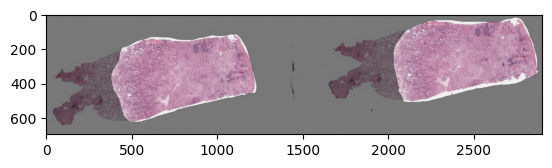

In [11]:
ShowOverlapMask(img, maskAnno, 1/4, pathSave="test_anno.png")

In [12]:
SaveMaskBigtiff("test_spec.tif", maskSpec)
SaveMaskBigtiff("test_anno.tif", maskAnno)

In [62]:
from openslide import OpenSlide
from tifffile import imread
from numpy import abs, arange, argmin, array, log10, mean, meshgrid, round
from numpy.random import shuffle


def GetRandomCoordinates(sizePatch, sizeFull):
    """Make random coordinates of patch images.

    Divide WSI's width and height by patch size.
    Consist coordination by using combination each x, y coordinate value.
    Finally return randomize coordinates array.

    Parameters
    ----------
    sizePatch : 2-D Array
        Pixel size of each patch image's width and height.

    sizeFull : 2-D Array
        Entire size of full image.
    
    Returns
    -------
    combinations : 3-D Array
        Randomized patch image's coordinates array.

    Examples
    --------
    >>> import numpy as np

    >>> GetRandomCoordinates(np.array([5, 5]), np.array([20, 20]))
    array([[10,  0],
           [ 5, 10],
           [10, 10],
           [ 0,  5],
           [ 0, 10],
           [ 0,  0],
           [10,  5],
           [ 5,  5],
           [ 5,  0]])
    """
    patchX, patchY = sizePatch
    fullX, fullY = sizeFull

    xArange = arange(0, fullX - patchX, patchX)
    yArange = arange(0, fullY - patchY, patchY)
    combinations = array(np.meshgrid(xArange, yArange)).T.reshape(-1,2)
    shuffle(combinations)

    return combinations

class WSIPatchImporter:
    """WSI patch image and mask import class.

    This class to easily load WSi patch image and masking region.
    When declarate class, Initialize patch size at 500 micron and 250 interval size.
    Set default WSI slide level as fit on 128 pixel resizing image.

    Parameters
    ----------
    pathWSI : String
        WSI file path.
    pathSpec : String
        Specific mask file path.
    pathAnno : String
        Annotation mask file path.

    Attributes
    ----------
    handle : Dictionary
        Bigtiff handle value, it has "WSI", "spec", "anno" keys
        WSI = openslide handle
        spec, anno = tifffile mask handle
    boundsDic : Dictionary
        WSI boundary information dictionary
        'x' (x axis boundary coordinate), 'y' (y axis boundary coordinate),
        'w' (whole slide image width), 'h' (whole slide image height)
    mppDic : Dictionary
        Micron per pixel parameters abour slide image.
        'x' (x mpp), 'y' (y mpp), "min" (minimun value in x, y)
    downsampleDic : Dictionary
        Level 0 slide image size / some of image size value.
    level : Int
        Current import slide level.
    sizePixelXY : Dictionary
        Current patch image import pixel size.
    resizePixelXY
        Current patch image resizing pixel size.
        
    Method
    ------
    SetProperties(self)
        Initial method of set Whole Slide Image's properties as easily readable value.
    SetDownsamples(self)
        Initial method of calculate downsample ratio of WSI and mask.
    MakePatchCoordinates(self, sizeMicronXY, intervalMicronXY, resizePixelXY)
        Create patch image coordinates and set default import size.
    LoadImage(self, coordinate, level=None, size=None, resize=None)
        WSI patch image import.
    LoadMask(self, maskType, coordinate, size=None)
        Mask array import.
    IsUsfulMask(self, maskType, coordinatesList, ratioPass=0.5, size=None)
        Check mask array usable.
    """
    def __init__(self, pathWSI, pathSpec, pathAnno):

        self.maskTypeList = ["spec", "anno"]
        self.handle = {}
        self.handle["WSI"] = OpenSlide(pathWSI)
        self.handle["spec"] = imread(pathSpec)
        self.handle["anno"] = imread(pathAnno)

        self.SetProperties()
        self.SetDownsamples()
        self.MakePatchCoordinates(array([500, 500]), array([250, 250]), array([128, 128]))

    def SetProperties(self):
        """Initial method of set Whole Slide Image's properties as easily readable value.

        bounds x, y parameters are start coordinate of WSI.
        bounds w, h parameters are pixel size of WSI
        bounds parameters are based on level 0 slide image.

        mpp parameters will use convert micron size to pixel value.
        In many case mpp paramter's x and y values are same.
        But if they have different values, Default mpp paramter is set minimum case.
        """
        properties = self.handle["WSI"].properties
        self.boundsDic = {}
        if "openslide.bounds-x" in properties:
            self.boundsDic['x'] = int(properties["openslide.bounds-x"])
            self.boundsDic['y'] = int(properties["openslide.bounds-y"])
            self.boundsDic['w'] = int(properties["openslide.bounds-width"])
            self.boundsDic['h'] = int(properties["openslide.bounds-height"])
        else:
            self.boundsDic['x'] = 0
            self.boundsDic['y'] = 0
            self.boundsDic['w'] = int(properties["openslide.level[0].width"])
            self.boundsDic['h'] = int(properties["openslide.level[0].height"])

        self.mppDic = {}
        _x = float(properties["openslide.mpp-x"])
        _y = float(properties["openslide.mpp-y"])
        self.mppDic['x'] = _x
        self.mppDic['y'] = _y
        self.mppDic["min"] = min(_x, _y)
        return None

    def SetDownsamples(self):
        """Initial method of calculate downsample ratio of WSI and mask.

        Set WSI level downsample list as ndarray type.
        Calcuate and set mask downsample value by (mask size / level 0 slide image size).
        """
        self.downsampleDic = {}
        self.downsampleDic["WSI"] = array(self.handle["WSI"].level_downsamples)
        for maskType in self.maskTypeList:
            _h, _w, _ = self.handle[maskType].shape
            self.downsampleDic[maskType] = array([self.boundsDic['w'] / _w, self.boundsDic['h'] / _h]).mean()
        return None

    def MakePatchCoordinates(self, sizeMicronXY, intervalMicronXY, resizePixelXY):
        """Create patch image coordinates and set default import size.

        Calculate apt slide level for import image from WSI file.
        Selected level is which has (image pixel size / double resizing pixel size) ratio nearest at 1.
        Pixel size is calculated by (micron size / minimum mpp parameter).
        Import image's pixel size and resizing pixel size will be saved Attributes parameter as sizePixelXY and resizePixelXY.
        Also each mask's import pixel size are saved sizePixelXY parameter.

        After that, When image importing by LoadMask Method and if not input size and level parameter,
        Automatically use default pixel size parameter which set on this Method.

        Parameters
        ----------
        sizeMicronXY : 2-D Array
            Micrometer patch size array [x, y].
        intervalMicronXY : 2-D Array
            Micrometer interval size array [x, y].
        resizePixelXY : 2-D Array
            Pixel image resizing array [x, y].

        Returns
        -------
        coordinates : 3-D Array
            Patch image start coordinates [x, y] array in slide level 0.

        See Also
        --------
        GetRandomCoordinates : Make random coordinates of patch images.
        LoadImage : WSI patch image import.
        LoadMask : Mask array import.
        """
        sizePixelXY = sizeMicronXY / self.mppDic['min']
        sizePixelLevel = sizePixelXY.mean() / self.downsampleDic["WSI"]
        sizeRatio = sizePixelLevel / 2 / resizePixelXY.mean()
        self.level = log10(sizeRatio).__abs__().argmin()
        self.sizePixelXY = {}
        self.sizePixelXY["WSI"] = (sizePixelXY / self.downsampleDic["WSI"][self.level]).round().astype(int)
        self.resizePixelXY = resizePixelXY

        for maskType in self.maskTypeList:
            downsampleMask = self.downsampleDic["WSI"][self.level] / self.downsampleDic[maskType]
            self.sizePixelXY[maskType] = (self.sizePixelXY["WSI"] * downsampleMask).round().astype(int)

        sizePatch = (intervalMicronXY / self.mppDic['min']).astype(int)
        sizeFull = (self.boundsDic['w'], self.boundsDic['h'])
        coordinates = GetRandomCoordinates(sizePatch, sizeFull)

        return coordinates

    def LoadImage(self, coordinate, level=None, size=None, resize=None):
        """WSI patch image import.

        Using openslide read_region, patch image extract from WSI file.

        Parameters
        ----------
        coordinate : 2-D Array
            Start coordinate of patch image in slide level 0.
        level : Int, default: None
            Import slide level. Actually default parameter is self.level Attribute.
        size : 2-D Array, default: None
            Import slide pixel size. Actually default parameter is self.sizePixelXY["WSI"] Attribute.
        resize : 2-D Array, default: None
            Patch image resizing size. Actually default parameter is self.resizePixelXY Attribute.

        Returns
        -------
        img : 3-D Array
            Imported patch image array.
        """
        x, y = coordinate
        x += self.boundsDic['x']
        y += self.boundsDic['y']
        if not level:
            level = self.level
        if not size:
            size = self.sizePixelXY["WSI"]
        if not resize:
            resize = self.resizePixelXY
        img = array(self.handle["WSI"].read_region((x, y), level, size).convert("RGB"))

        return img

    def LoadMask(self, maskType, coordinate, size=None):
        """Mask array import.

        Import mask array from bigtiff mask file.
        Convert coordinate of WSI to downsample adjusted coordinate of mask.
        Just return one chennel array from tiff.

        Parameters
        ----------
        maskType : String
            Mask type ["spec", "anno"].
        coordinate : 2-D Array
            Start coordinate of patch image in slide level 0.
        size : 2-D Array, default: None
            Import mask size. Actually default parameter is self.sizePixelXY[maskType] Attribute.

        Returns
        -------
        mask : 2-D Array
            Imported mask array.

        See Also
        --------
        IsUsfulMask : Check mask array usable.
        """
        coordinate = (coordinate / self.downsampleDic[maskType]).round().astype(int)
        if not size:
            size = self.sizePixelXY[maskType]
        xSta = coordinate[1]
        xEnd = coordinate[1] + size[1]
        ySta = coordinate[0]
        yEnd = coordinate[0] + size[0]

        return self.handle[maskType][xSta:xEnd,ySta:yEnd,0]

    def IsUsfulMask(self, maskType, coordinatesList, ratioPass=0.5, size=None):
        """Check mask array usable.

        Import mask array from LoadMask Method.
        Calculate ratio of (average of mask value / 255) and check this over ratioPass or not.

        Parameters
        ----------
        maskType : String
            Mask type ["spec", "anno"].
        coordinate : 2-D Array
            Start coordinate of patch image in slide level 0.
        ratioPass : Float, default: 0.5
            Passing score ratio.
        size : 2-D Array, default: None
            Import mask size. Actually default parameter is self.sizePixelXY[maskType] Attribute.

        Returns
        -------
        booleanArray : 1-D Array
            True / False array about coordinatesList parameter.
        """
        boolList = []
        for coordinate in coordinatesList:
            mask = self.LoadMask(maskType, coordinate, size)
            ratioUseful = mask.mean() / 255
            if ratioUseful > ratioPass:
                boolList.append(True)
            else:
                boolList.append(False)

        return array(boolList)

In [63]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

cur = LoginWSIViewer()
wsiluadinfo = GetWSIInfos(cur, "wsiluadinfo")
pathWSI = wsiluadinfo["TCGA-38-A44F-01Z-00-DX1"]["filepath"]
pathSpec = "test_spec.tif"
pathAnno = "test_anno.tif"
patchImporter = WSIPatchImporter(pathWSI, pathSpec, pathAnno)

In [64]:
print(patchImporter.__doc__)

WSI patch image and mask import class.

    This class to easily load WSi patch image and masking region.
    When declarate class, Initialize patch size at 500 micron and 250 interval size.
    Set default WSI slide level as fit on 128 pixel resizing image.

    Parameters
    ----------
    pathWSI : String
        WSI file path.
    pathSpec : String
        Specific mask file path.
    pathAnno : String
        Annotation mask file path.

    Attributes
    ----------
    handle : Dictionary
        Bigtiff handle value, it has "WSI", "spec", "anno" keys
        WSI = openslide handle
        spec, anno = tifffile mask handle
    boundsDic : Dictionary
        WSI boundary information dictionary
        'x' (x axis boundary coordinate), 'y' (y axis boundary coordinate),
        'w' (whole slide image width), 'h' (whole slide image height)
    mppDic : Dictionary
        Micron per pixel parameters abour slide image.
        'x' (x mpp), 'y' (y mpp), "min" (minimun value in x, y)
  

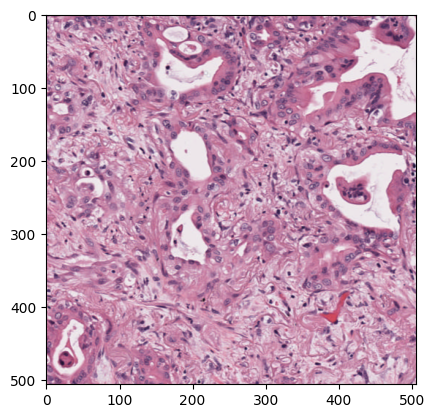

In [11]:
plt.imshow(patchImporter.LoadImage((150000, 10000), 1))
plt.show()

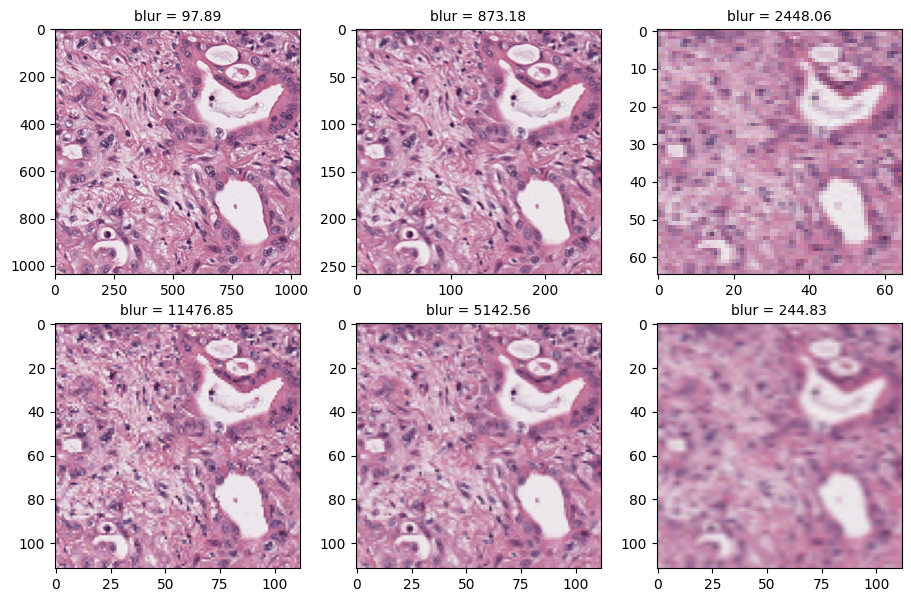

In [28]:
size = 256
levelMicronSize = round(size / patchImporter.mppDic['x'] / np.array(patchImporter.handle["WSI"].level_downsamples)).astype(int)

plt.figure(figsize=(11,7))
for num in range(3):
    imageLevel = np.array(patchImporter.handle["WSI"].read_region((150000, 10000), num, (levelMicronSize[num], levelMicronSize[num])).convert("RGB"))
    plt.subplot(2,3,1+num)
    plt.title("blur = %.2f"%cv2.Laplacian(cv2.cvtColor(imageLevel, cv2.COLOR_BGR2GRAY), cv2.CV_64F).var(), size=10)
    plt.imshow(imageLevel)
    plt.subplot(2,3,4+num)
    imageLevelRe = cv2.resize(imageLevel, dsize=(112, 112))
    plt.title("blur = %.2f"%cv2.Laplacian(cv2.cvtColor(imageLevelRe, cv2.COLOR_BGR2GRAY), cv2.CV_64F).var(), size=10)
    plt.imshow(imageLevelRe)
plt.show()

In [30]:
sizeMicronXY = np.array([1000, 500])
sizeReXY = np.array([256, 128])

mpp = patchImporter.mppDic['min']
downsampleLevel = np.array(patchImporter.handle["WSI"].level_downsamples)
levelMicronSize = sizeMicronXY.mean() / mpp / downsampleLevel

In [31]:
sizeRatio = levelMicronSize / 2 / sizeReXY.mean()
level = np.argmin(np.abs(np.log10(sizeRatio)))

In [33]:
sizePx = np.round(sizeMicronXY / mpp / patchImporter.handle["WSI"].level_downsamples[level]).astype(int)

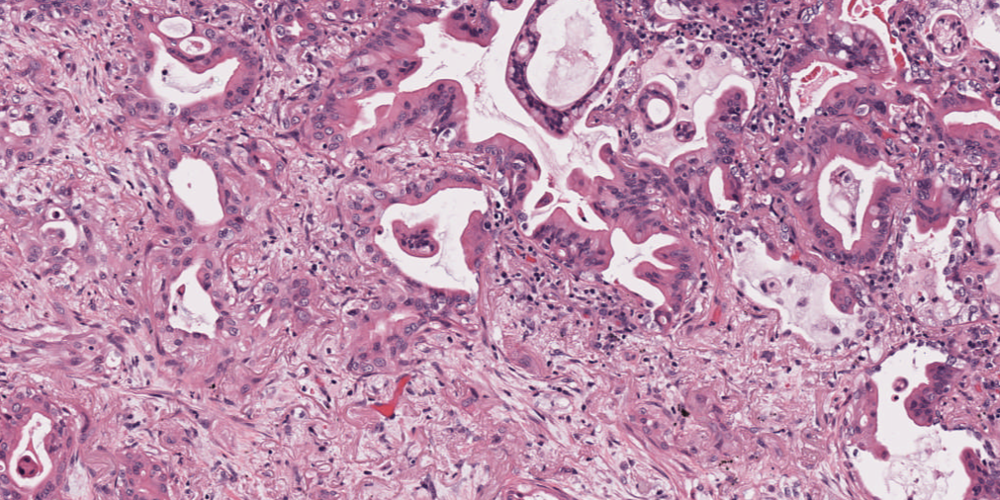

In [35]:
patchImporter.handle["WSI"].read_region((150000, 10000), level, sizePx)

In [36]:
sizeMicronXY = np.array([1000, 500])
intervalMicronXY = np.array([500, 250])
resizePixelXY = np.array([256, 128])

coordinatesPatch = patchImporter.MakePatchCoordinates(sizeMicronXY, intervalMicronXY, resizePixelXY)

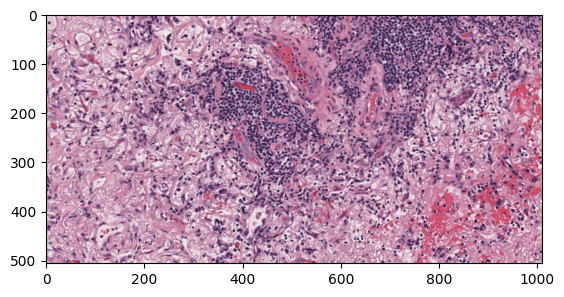

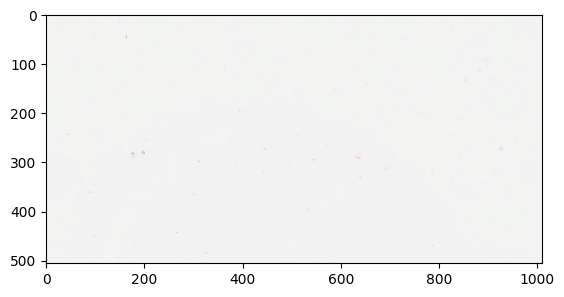

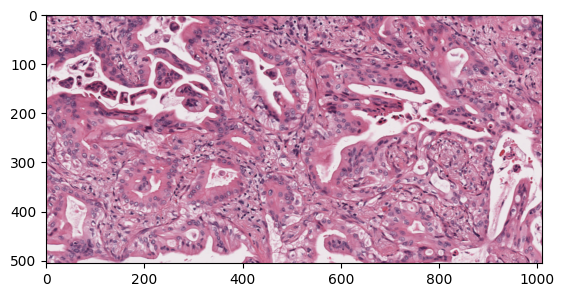

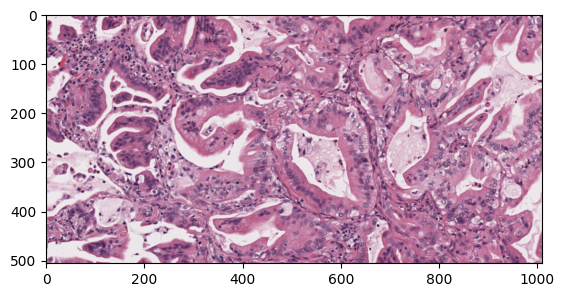

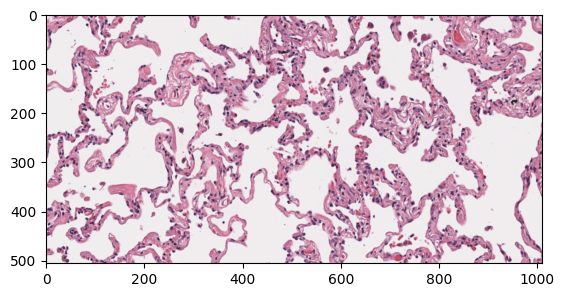

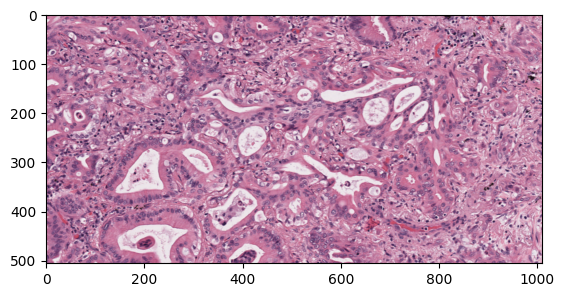

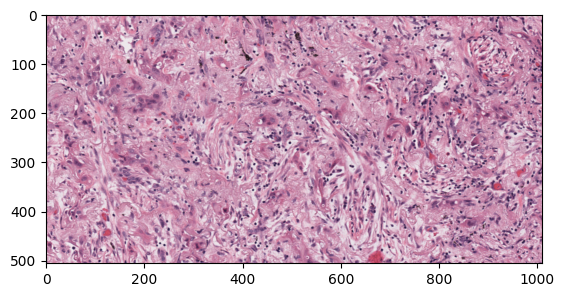

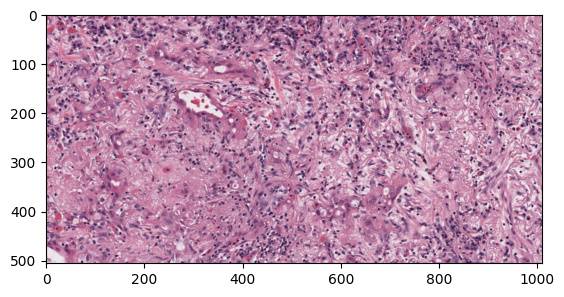

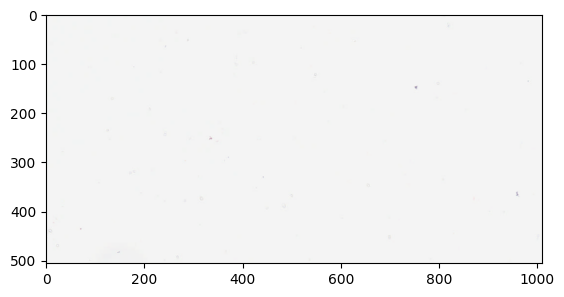

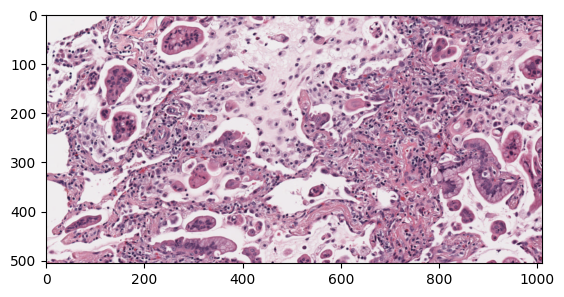

In [39]:
for num in range(10):
    plt.imshow(patchImporter.LoadImage(coordinatesPatch[num]))
    plt.show()

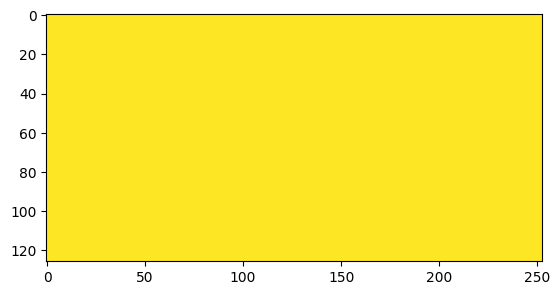

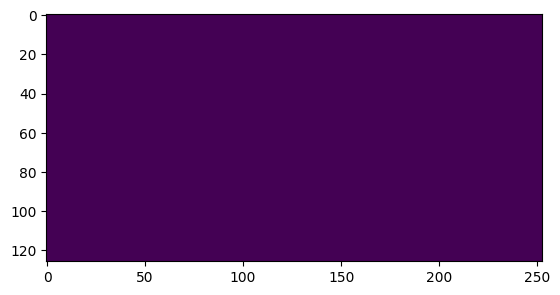

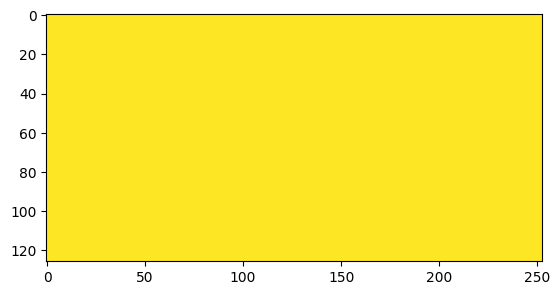

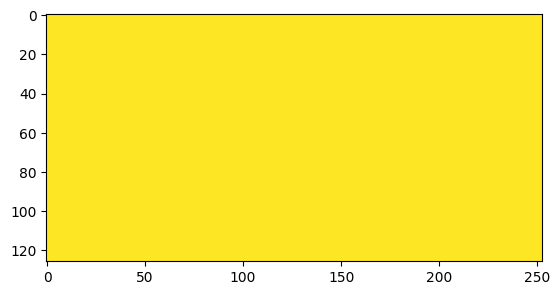

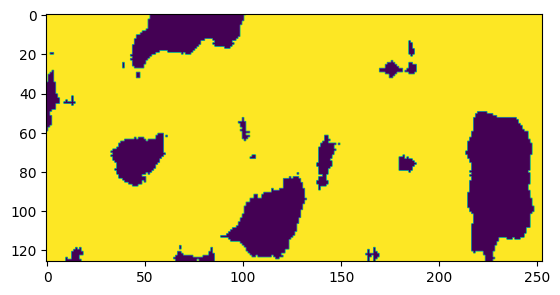

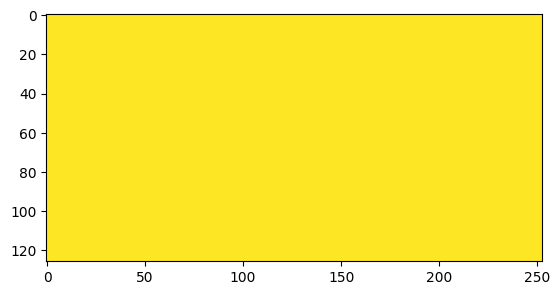

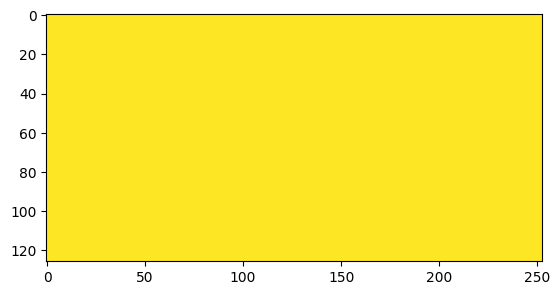

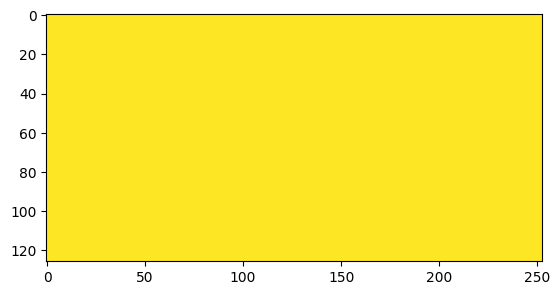

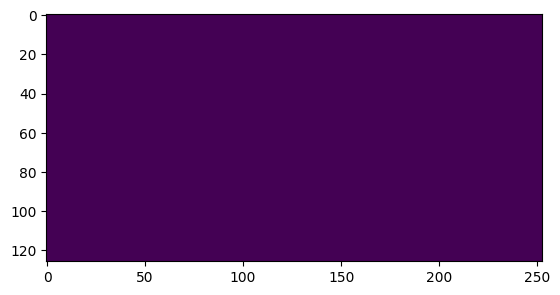

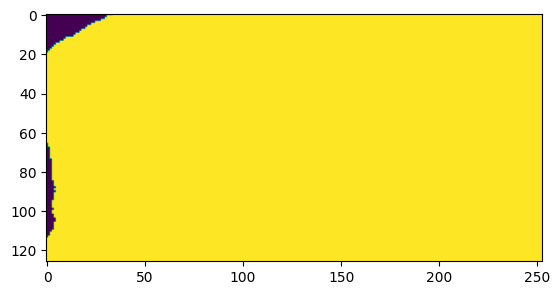

In [40]:
for num in range(10):
    plt.imshow(patchImporter.LoadMask("spec", coordinatesPatch[num]), vmin=0, vmax=255)
    plt.show()

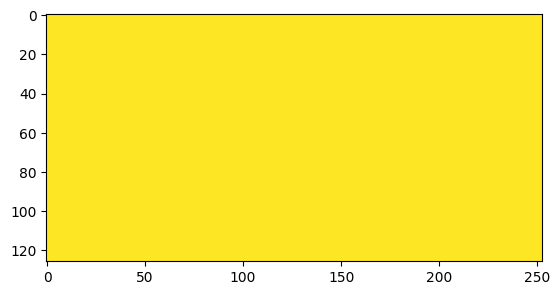

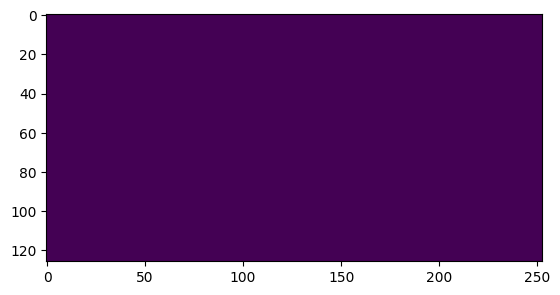

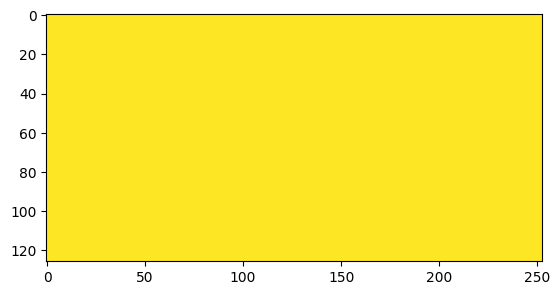

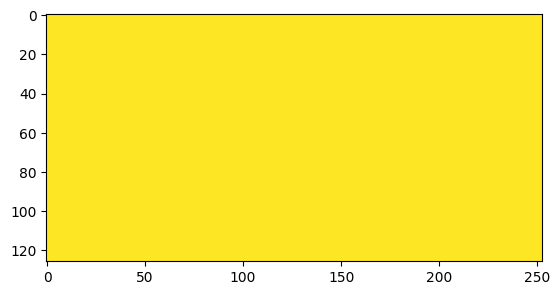

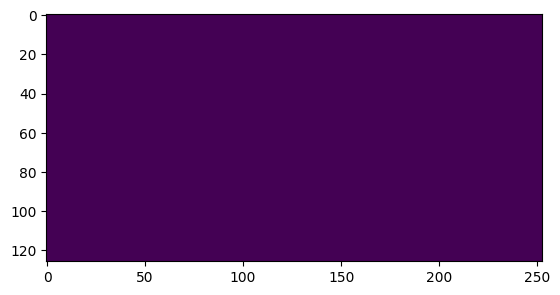

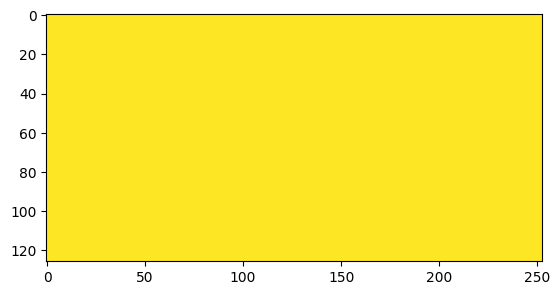

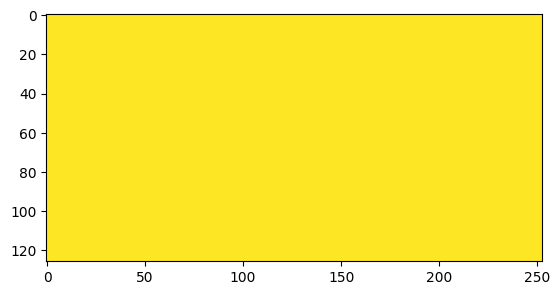

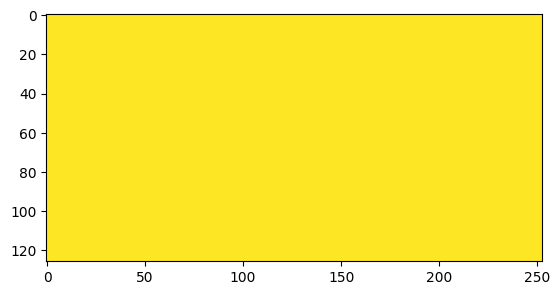

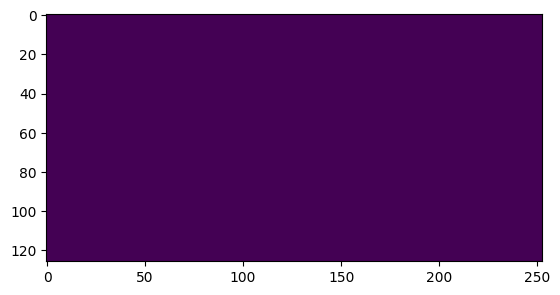

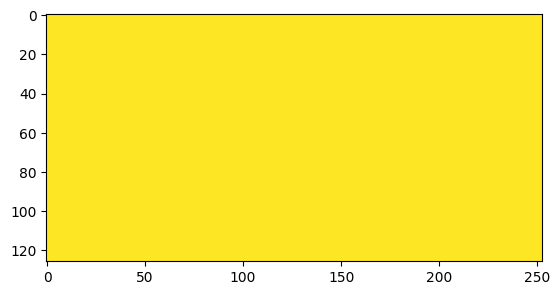

In [42]:
for num in range(10):
    plt.imshow(patchImporter.LoadMask("anno", coordinatesPatch[num]), vmin=0, vmax=255)
    plt.show()

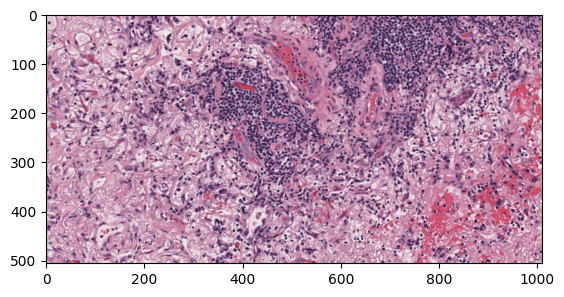

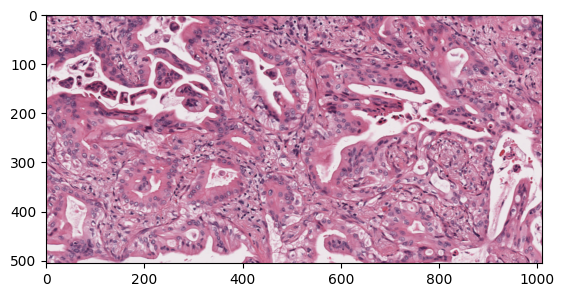

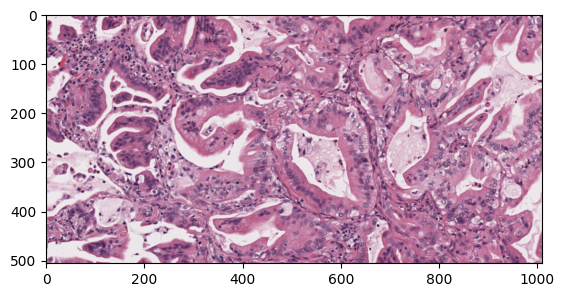

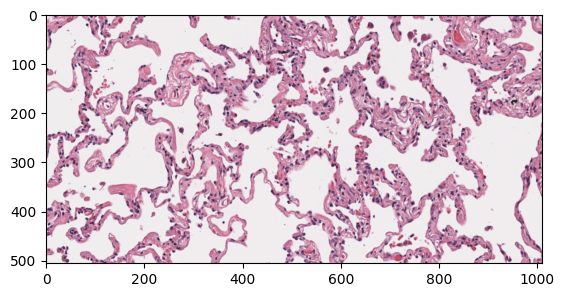

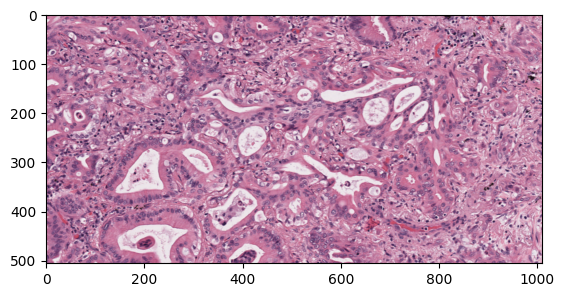

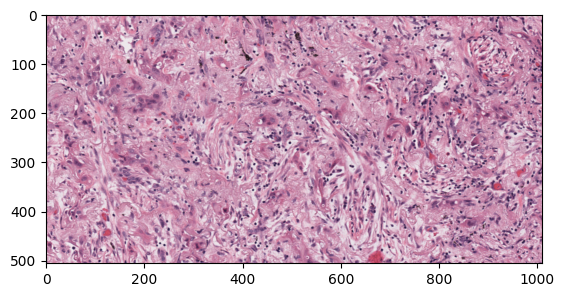

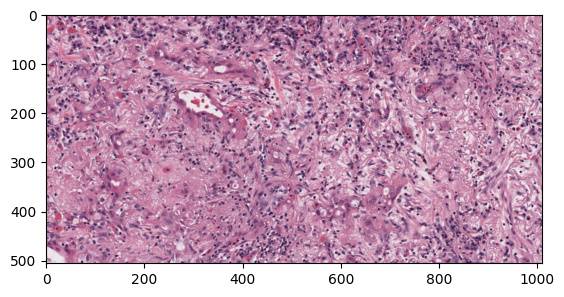

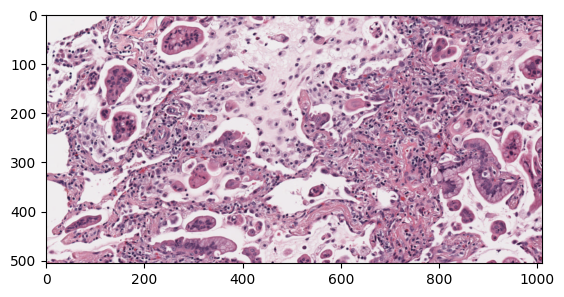

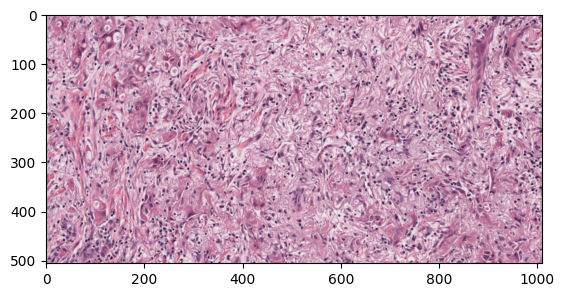

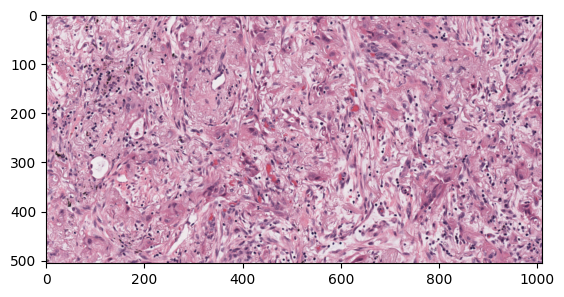

In [46]:
for coordinate in coordinatesPatch[patchImporter.IsUsfulMask("spec", coordinatesPatch)][:10]:
    plt.imshow(patchImporter.LoadImage(coordinate))
    plt.show()

In [68]:
a = np.array(-1.0)

In [70]:
a.__abs__()

1.0

In [71]:
help(a)

Help on ndarray object:

class ndarray(builtins.object)
 |  ndarray(shape, dtype=float, buffer=None, offset=0,
 |          strides=None, order=None)
 |  
 |  An array object represents a multidimensional, homogeneous array
 |  of fixed-size items.  An associated data-type object describes the
 |  format of each element in the array (its byte-order, how many bytes it
 |  occupies in memory, whether it is an integer, a floating point number,
 |  or something else, etc.)
 |  
 |  Arrays should be constructed using `array`, `zeros` or `empty` (refer
 |  to the See Also section below).  The parameters given here refer to
 |  a low-level method (`ndarray(...)`) for instantiating an array.
 |  
 |  For more information, refer to the `numpy` module and examine the
 |  methods and attributes of an array.
 |  
 |  Parameters
 |  ----------
 |  (for the __new__ method; see Notes below)
 |  
 |  shape : tuple of ints
 |      Shape of created array.
 |  dtype : data-type, optional
 |      Any objec

In [76]:
a.ctypes

In [9]:
import numpy as np

np.array([1.1]).round(-1)

array([0.])

In [8]:
help(np.around)

Help on function around in module numpy:

around(a, decimals=0, out=None)
    Evenly round to the given number of decimals.
    
    Parameters
    ----------
    a : array_like
        Input data.
    decimals : int, optional
        Number of decimal places to round to (default: 0).  If
        decimals is negative, it specifies the number of positions to
        the left of the decimal point.
    out : ndarray, optional
        Alternative output array in which to place the result. It must have
        the same shape as the expected output, but the type of the output
        values will be cast if necessary. See :ref:`ufuncs-output-type` for more
        details.
    
    Returns
    -------
    rounded_array : ndarray
        An array of the same type as `a`, containing the rounded values.
        Unless `out` was specified, a new array is created.  A reference to
        the result is returned.
    
        The real and imaginary parts of complex numbers are rounded
        separa

In [11]:
np.array([[1,2], [3,4], [5,6]], axis=2)

TypeError: array() got an unexpected keyword argument 'axis'